In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go

# df = pd.read_csv('mitdb__100_180.txt', header=None)
# df[0].plot()
# print(df.shape)

In [2]:
df = pd.read_csv('ann_gun_CentroidA1.csv')

In [3]:
from plotly.offline import init_notebook_mode, iplot
import plotly.express as px
import plotly.graph_objs as go
import numpy as np

def show_ts(Time_serie, discord_position, discord_length):
    init_notebook_mode(connected=True)  
    fig = go.Figure()
        # Full line 3721; 6180
    anomalies = np.array([float('inf') for _ in Time_serie])
    for position in discord_position:
        anomalies[position:position+discord_length] = Time_serie[position:position+discord_length]
        
    fig.add_scattergl(x=list(range(len(Time_serie))), y=Time_serie, line={'color': 'gray'}, name='Normal points')
    fig.add_scattergl(x=list(range(len(Time_serie))), y=anomalies, line={'color': 'red'}, name='discords')
    iplot(fig)

In [6]:
df = pd.read_csv('mitdb__100_180.txt', header=None, names=['value'])
show_ts(df['value'].values, [800, 900, 1100, 1200, 1400, 1500, 1800, 1900], 200)

In [7]:
df = pd.read_csv('mitdb__100_180.txt', header=None, names=['value'])
show_ts(df['value'].values, [1900], 200)

In [23]:
indexes = np.linspace(0,1,df.shape[0])
fig = go.Figure()
a = [e if 2500<=i<2700 else float('inf') for i, e in enumerate(df['value'].values)]
fig.add_trace(go.Scatter(x=indexes, y=df['value']))
fig.add_trace(go.Scatter(x=indexes, y=a, name='anomaly'))
fig.add_trace(go.Scatter(y=np.array([0 for _ in df['value']]), x=a, name='points'))
iplot(fig)

In [18]:
df = pd.read_csv('mitdb__100_180.txt', header=None, names=['value'])
show_ts(df['value'].values, [1900], 200)

In [20]:
df = pd.read_csv('chfdbchf15_1.csv', header=None, names=['value'])
show_ts(df['value'].values, [2250], 200)

In [37]:
# _1 signifie index 1
df = pd.read_csv('mitdbx_mitdbx_108_1.txt', header=None, names=['value'])
df2 = pd.read_csv('mitdbx_mitdbx_108.txt', header=None, sep='\s+')
df2['value'] = df2[1]
show_ts(df['value'].values, [4017,10014,10871], 600)
show_ts(df2['value'].values, [4017,10014,10871], 600)

In [41]:
df = pd.read_csv('qtdbsele0606.txt', header=None, sep='\s+')
df['value'] = df[1]
df[1].to_csv('qtdbsele0606_1.txt', index=False)
show_ts(df['value'].values, [1150], 40)

In [61]:
df = pd.read_csv('ann_gun_CentroidA1.csv', header=None, names=['value'])
show_ts(df['value'].values, [300], 150)

In [44]:
df = pd.read_csv('dutch_power_demand.txt', header=None, names=['value'])
show_ts(df['value'].values, [11453,33993,7786,12639], 800)

In [51]:
np.fromfile('x_108.dat')

array([ 1.16452116e-058, -1.12516901e+190,  2.66867303e+155, ...,
        2.45629961e+018, -4.06617381e+000,  2.54176770e-230])

In [60]:
df = pd.read_fwf('nprs44.txt', header=None, names=['value'])
show_ts(df['value'].values, [22000], 100)

In [68]:
>>> import pandas as pd
>>> from numpy.random import randint

>>> df = pd.DataFrame(columns=['lib', 'qty1', 'qty2'])
>>> for i in range(5):
>>>     df.loc[i] = ['name' + str(i)] + list(randint(10, size=2))
df

,lib,qty1,qty2
0,name0,1,6
1,name1,9,6
2,name2,8,2
3,name3,0,3
4,name4,4,3


In [78]:
df.loc[5, 'lib'] = [10, 12]
df

ValueError: Must have equal len keys and value when setting with an iterable

In [4]:

init_notebook_mode(connected=True)  
w = 362
fig = go.Figure()
    # Full line 3721; 6180
anomalies = [x if ((3721 <= i < 3721+w) or (6180 <= i < 6180+w))
             else float('inf') for i, x in enumerate(df['value'])]
fig.add_scattergl(x=df.index, y=df['value'], line={'color': 'gray'})
fig.add_scattergl(x=df.index, y=anomalies, line={'color': 'red'})
iplot(fig)

In [15]:
def distance(a, b):
    x = a
    y = b
    # ******songer à tester sans la distance normale ajoutée  pour voir l plus de la distance proposée
    return np.linalg.norm(a - b)*np.sqrt(2*len(x)*(1-np.corrcoef(x, y)[0][1]))

Distance avant : 7.450580596923828e-07
Distance après : 104.44659357341871
[10 11 12 13 14 15 16 17 18 19]
[17 23 19 24 16 21 22 18 15 20]
size intersect 5 1.0
[15 16 17 18 19]


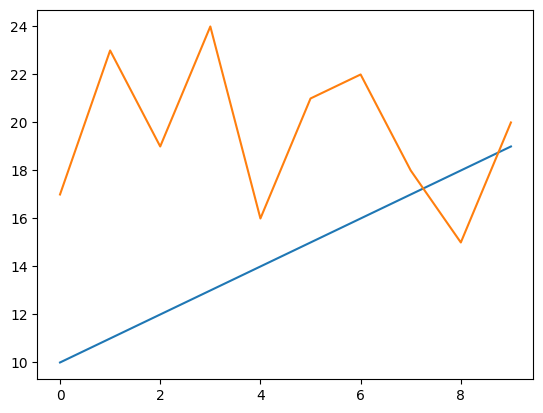

In [18]:
from scipy.spatial.distance import hamming
a = np.arange(10,20, 1)
np.random.seed(0)
b = np.arange(15,25, 1)
print('Distance avant :', distance(a,b))
np.random.shuffle(b)
print('Distance après :', distance(a,b))

print(a)
print(b)
print('size intersect',len(np.intersect1d(a, b)), hamming(a, b))
print(np.intersect1d(a, b))
plt.plot(a)
plt.plot(b)

In [24]:
# define an objective function
def objective(args):
    case, val = args
    if case == 'case 1':
        return val
    else:
        return val ** 2

# define a search space
from hyperopt import hp
space = hp.choice('a',
    [
        ('case 1', 1 + hp.lognormal('c1', 0, 1)),
        ('case 2', hp.uniform('c2', -10, 10))
    ])

# minimize the objective over the space
from hyperopt import fmin, tpe
best = fmin(objective, space, algo=tpe.suggest, max_evals=100)

print (best)
# -> {'a': 1, 'c2': 0.01420615366247227}
print (hyperopt.space_eval(space, best))
# -> ('case 2', 0.01420615366247227}

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 331.51trial/s, best loss: 8.274842475396198e-05]
{'a': 1, 'c2': 0.009096616115565281}
('case 2', 0.009096616115565281)
